In [ ]:
!pip install keras-tuner

In [ ]:
!pip install ultralytics

In [ ]:
import numpy as np
import tensorflow as tf
import pandas as pd
import os
import json

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

import keras_tuner as kt

# PATH
train_path = '/content/drive/MyDrive/Dataset_TugasAkhir/SplitNew/Train'
test_path  = '/content/drive/MyDrive/Dataset_TugasAkhir/SplitNew/Test'
save_path  = '/content/drive/MyDrive/Dataset_TugasAkhir/Models'

IMG_SIZE   = (224, 224)
BATCH_SIZE = 32

# CREATE DATAFRAME
def create_df(path):
    files, labels = [], []
    for category in ['Edible', 'Poisonous']:
        cat_path = os.path.join(path, category)
        for species in os.listdir(cat_path):
            species_path = os.path.join(cat_path, species)
            if os.path.isdir(species_path):
                for f in os.listdir(species_path):
                    if f.lower().endswith(('png', 'jpg', 'jpeg')):
                        files.append(os.path.join(species_path, f))
                        labels.append(species)
    return pd.DataFrame({'filename': files, 'class': labels})

df = create_df(train_path)

df_train, df_val = train_test_split(
    df,
    test_size=0.1,
    stratify=df['class'],
    random_state=42
)

# DATA GENERATOR
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=30,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_base = train_datagen.flow_from_dataframe(
    df_train,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

val_base = val_datagen.flow_from_dataframe(
    df_val,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# BINARY MAPPING
class_indices  = train_base.class_indices
edible_species = os.listdir(os.path.join(train_path, 'Edible'))
edible_indices = [v for k, v in class_indices.items() if k in edible_species]

# SAVE CLASS INDICES
os.makedirs(save_path, exist_ok=True)
with open(os.path.join(save_path, 'class_indices.json'), 'w') as f:
    json.dump(class_indices, f)
print("class_indices.json tersimpan!")

def multi_output_generator(gen):
    while True:
        x, y_sp = next(gen)
        idx   = np.argmax(y_sp, axis=1)
        y_bin = np.array([0 if i in edible_indices else 1 for i in idx]).astype('float32')
        yield x, {'output_biner': y_bin, 'output_spesies': y_sp}

train_gen = multi_output_generator(train_base)
val_gen   = multi_output_generator(val_base)

# MODEL BUILDER (TUNER)
def build_model(hp):

    input_layer = Input(shape=(224, 224, 3))

    base_model = MobileNetV2(
        weights='imagenet',
        include_top=False,
        input_tensor=input_layer
    )

    for layer in base_model.layers:
        layer.trainable = False

    x = GlobalAveragePooling2D()(base_model.output)

    num_layers = hp.Int('num_dense_layers', min_value=1, max_value=2, step=1)

    for i in range(num_layers):
        x = Dense(
            units=hp.Choice(f'dense_units_{i}', values=[128, 256, 512, 1024]),
            activation='relu'
        )(x)
        x = Dropout(
            rate=hp.Choice(f'dropout_{i}', values=[0.2, 0.3, 0.4, 0.5])
        )(x)

    out_bin = Dense(1, activation='sigmoid', name='output_biner')(x)
    out_sp  = Dense(len(class_indices), activation='softmax', name='output_spesies')(x)

    model = Model(inputs=input_layer, outputs=[out_bin, out_sp])

    lr = hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-4, 1e-6])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
        loss={
            'output_biner': 'binary_crossentropy',
            'output_spesies': 'categorical_crossentropy'
        },
        metrics={
            'output_biner': 'accuracy',
            'output_spesies': 'accuracy'
        }
    )

    return model

# CALLBACKS
checkpoint = ModelCheckpoint(
    filepath=os.path.join(save_path, 'best_model_mobilenet_tuned_v4.keras'),
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

callbacks = [
    EarlyStopping(patience=5, restore_best_weights=True),
    ReduceLROnPlateau(factor=0.3, patience=3),
    checkpoint
]

# TUNER
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    directory='/content/drive/MyDrive/keras_tuner',
    project_name='mobilenet_mushroom_v4'   # ← project name baru
)

# SEARCH
tuner.search(
    train_gen,
    steps_per_epoch=len(df_train) // BATCH_SIZE,
    validation_data=val_gen,
    validation_steps=len(df_val) // BATCH_SIZE,
    epochs=10,
    callbacks=callbacks
)

# BEST MODEL
best_hps = tuner.get_best_hyperparameters(1)[0]

print("\n" + "="*40)
print("=== HYPERPARAMETER TERBAIK ===")
print("="*40)
print(f"Learning Rate      : {best_hps.get('learning_rate')}")
print(f"Jumlah Dense Layer : {best_hps.get('num_dense_layers')}")
print("-"*40)
num_layers = best_hps.get('num_dense_layers')
for i in range(num_layers):
    print(f"Dense Layer {i+1}:")
    print(f"  Units   : {best_hps.get(f'dense_units_{i}')}")
    print(f"  Dropout : {best_hps.get(f'dropout_{i}'):.2f}")
    print("-"*40)
tuner.results_summary()

model = tuner.hypermodel.build(best_hps)

# TRAIN FINAL
history = model.fit(
    train_gen,
    steps_per_epoch=len(df_train) // BATCH_SIZE,
    validation_data=val_gen,
    validation_steps=len(df_val) // BATCH_SIZE,
    epochs=15,
    callbacks=callbacks
)



Trial 10 Complete [00h 39m 49s]
val_loss: 0.8275296092033386

Best val_loss So Far: 0.814045250415802
Total elapsed time: 06h 55m 53s

=== HYPERPARAMETER TERBAIK ===
Learning Rate      : 0.0001
Jumlah Dense Layer : 2
----------------------------------------
Dense Layer 1:
  Units   : 1024
  Dropout : 0.20
----------------------------------------
Dense Layer 2:
  Units   : 256
  Dropout : 0.40
----------------------------------------
Results summary
Results in /content/drive/MyDrive/keras_tuner/mobilenet_mushroom_v4
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 02 summary
Hyperparameters:
num_dense_layers: 2
dense_units_0: 1024
dropout_0: 0.2
learning_rate: 0.0001
dense_units_1: 256
dropout_1: 0.4
Score: 0.814045250415802

Trial 09 summary
Hyperparameters:
num_dense_layers: 2
dense_units_0: 512
dropout_0: 0.4
learning_rate: 0.0001
dense_units_1: 128
dropout_1: 0.3
Score: 0.8275296092033386

Trial 03 summary
Hyperparameters:
num_dense_layers: 2
dense_units_0: 

In [ ]:
# CEK INDEX LAYER SEBELUM FINE TUNING
print(f"\nTotal layer: {len(model.layers)}")
print(f"Layer 153: {model.layers[153].name}")
print(f"Layer 154: {model.layers[154].name}")


Total layer: 161
Layer 153: out_relu
Layer 154: global_average_pooling2d_1


In [ ]:
# CEK INDEX LAYER OTOMATIS SEBELUM FINE TUNING
print(f"Total layer: {len(model.layers)}")

# Cari index terakhir MobileNetV2 secara otomatis
mobilenet_end_idx = None
for i, layer in enumerate(model.layers):
    if 'out_relu' in layer.name.lower() or 'conv_pw_13_relu' in layer.name.lower():
        mobilenet_end_idx = i

# Kalau tidak ketemu nama spesifik, cari layer terakhir sebelum GlobalAveragePooling
if mobilenet_end_idx is None:
    for i, layer in enumerate(model.layers):
        if 'global_average_pooling' in layer.name.lower():
            mobilenet_end_idx = i - 1
            break

print(f"MobileNetV2 end index terdeteksi: {mobilenet_end_idx}")
print(f"Layer {mobilenet_end_idx}    : {model.layers[mobilenet_end_idx].name}")
print(f"Layer {mobilenet_end_idx+1}  : {model.layers[mobilenet_end_idx+1].name}")

print("\nFINE TUNING START")

for layer in model.layers:
    layer.trainable = False

for layer in model.layers[mobilenet_end_idx + 1:]:
    layer.trainable = True
    print(f"Unfreezing head layer: {layer.name}")

start_unfreeze = mobilenet_end_idx - 30
for layer in model.layers[start_unfreeze: mobilenet_end_idx + 1]:
    layer.trainable = True
    print(f"Unfreezing MobileNet layer: {layer.name}")

# Re-Compile
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss={
        'output_biner': 'binary_crossentropy',
        'output_spesies': 'categorical_crossentropy'
    },
    metrics={
        'output_biner': 'accuracy',
        'output_spesies': 'accuracy'
    }
)

print("\nModel Re-Compiled. Memulai Fine-Tuning...")

history_finetune = model.fit(
    train_gen,
    steps_per_epoch=len(df_train) // BATCH_SIZE,
    validation_data=val_gen,
    validation_steps=len(df_val) // BATCH_SIZE,
    epochs=20,
    callbacks=callbacks
)

Total layer: 161
MobileNetV2 end index terdeteksi: 153
Layer 153    : out_relu
Layer 154  : global_average_pooling2d_1

FINE TUNING START
Unfreezing head layer: global_average_pooling2d_1
Unfreezing head layer: dense_2
Unfreezing head layer: dropout_2
Unfreezing head layer: dense_3
Unfreezing head layer: dropout_3
Unfreezing head layer: output_biner
Unfreezing head layer: output_spesies
Unfreezing MobileNet layer: block_13_project
Unfreezing MobileNet layer: block_13_project_BN
Unfreezing MobileNet layer: block_14_expand
Unfreezing MobileNet layer: block_14_expand_BN
Unfreezing MobileNet layer: block_14_expand_relu
Unfreezing MobileNet layer: block_14_depthwise
Unfreezing MobileNet layer: block_14_depthwise_BN
Unfreezing MobileNet layer: block_14_depthwise_relu
Unfreezing MobileNet layer: block_14_project
Unfreezing MobileNet layer: block_14_project_BN
Unfreezing MobileNet layer: block_14_add
Unfreezing MobileNet layer: block_15_expand
Unfreezing MobileNet layer: block_15_expand_BN
Unf

In [ ]:
import keras_tuner as kt
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model

def build_model(hp):
    input_layer = Input(shape=(224, 224, 3))
    base_model = MobileNetV2(
        weights='imagenet',
        include_top=False,
        input_tensor=input_layer
    )
    for layer in base_model.layers:
        layer.trainable = False

    x = GlobalAveragePooling2D()(base_model.output)

    num_layers = hp.Int('num_dense_layers', min_value=1, max_value=2, step=1)
    for i in range(num_layers):
        x = Dense(
            units=hp.Choice(f'dense_units_{i}', values=[128, 256, 512, 1024]),
            activation='relu'
        )(x)
        x = Dropout(
            rate=hp.Choice(f'dropout_{i}', values=[0.2, 0.3, 0.4, 0.5])
        )(x)

    out_bin = Dense(1, activation='sigmoid', name='output_biner')(x)
    out_sp  = Dense(20, activation='softmax', name='output_spesies')(x)

    model = Model(inputs=input_layer, outputs=[out_bin, out_sp])

    lr = hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-4, 1e-6])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
        loss={
            'output_biner': 'binary_crossentropy',
            'output_spesies': 'categorical_crossentropy'
        },
        metrics={
            'output_biner': 'accuracy',
            'output_spesies': 'accuracy'
        }
    )
    return model

# RELOAD TUNER
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    directory='/content/drive/MyDrive/keras_tuner',
    project_name='mobilenet_mushroom_v4'
)

best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print("\n" + "="*40)
print("=== HYPERPARAMETER TERBAIK ===")
print("="*40)
print(f"Learning Rate      : {best_hps.get('learning_rate')}")
print(f"Jumlah Dense Layer : {best_hps.get('num_dense_layers')}")
print("-"*40)

num_layers = best_hps.get('num_dense_layers')
for i in range(num_layers):
    print(f"Dense Layer {i+1}:")
    print(f"  Units   : {best_hps.get(f'dense_units_{i}')}")
    print(f"  Dropout : {best_hps.get(f'dropout_{i}'):.2f}")
    print("-"*40)

tuner.results_summary()

Reloading Tuner from /content/drive/MyDrive/keras_tuner/mobilenet_mushroom_v4/tuner0.json

=== HYPERPARAMETER TERBAIK ===
Learning Rate      : 0.0001
Jumlah Dense Layer : 2
----------------------------------------
Dense Layer 1:
  Units   : 1024
  Dropout : 0.20
----------------------------------------
Dense Layer 2:
  Units   : 256
  Dropout : 0.40
----------------------------------------
Results summary
Results in /content/drive/MyDrive/keras_tuner/mobilenet_mushroom_v4
Showing 10 best trials
Objective(name="val_loss", direction="min")

Trial 02 summary
Hyperparameters:
num_dense_layers: 2
dense_units_0: 1024
dropout_0: 0.2
learning_rate: 0.0001
dense_units_1: 256
dropout_1: 0.4
Score: 0.814045250415802

Trial 09 summary
Hyperparameters:
num_dense_layers: 2
dense_units_0: 512
dropout_0: 0.4
learning_rate: 0.0001
dense_units_1: 128
dropout_1: 0.3
Score: 0.8275296092033386

Trial 03 summary
Hyperparameters:
num_dense_layers: 2
dense_units_0: 256
dropout_0: 0.2
learning_rate: 0.0001
den

In [ ]:
import numpy as np
import tensorflow as tf

MODEL_PATH = '/content/drive/MyDrive/Dataset_TugasAkhir/Models/best_model_mobilenet_tuned_v4.keras'

# 1. Load Model
try:
    model = tf.keras.models.load_model(MODEL_PATH)
    print(f"✅ Model berhasil dimuat dari file: {MODEL_PATH}\n")
except Exception as e:
    print(f"⚠️ Error loading model: {e}")

# ------------------------------------------------------------------------------
# TRICK: Pass a dummy input tensor through the model to force shape build!
# ------------------------------------------------------------------------------
dummy_input = np.zeros((1, 224, 224, 3), dtype=np.float32)
_ = model(dummy_input, training=False)

# ==============================================================================
# 2. PRINT SUMMARY WITH REAL SHAPES
# ==============================================================================
print("=" * 85)
print(f"{'INDEX':<6} | {'TRAINABLE':<10} | {'LAYER NAME':<30} | {'OUTPUT SHAPE':<30}")
print("=" * 85)

for i, layer in enumerate(model.layers):
    try:
        # Try getting output_shape or output.shape from build execution
        if hasattr(layer, 'output_shape'):
            out_shape = layer.output_shape
        elif hasattr(layer, 'output'):
            out_shape = layer.output.shape
        else:
            out_shape = "Unknown"

        # Unpack if nested in list
        if isinstance(out_shape, list) and len(out_shape) > 0:
            out_shape = out_shape[0]

        out_shape_str = str(out_shape)
    except Exception:
        out_shape_str = "Unknown"

    print(f"{i:<6} | {str(layer.trainable):<10} | {layer.name:<30} | {out_shape_str:<30}")

print("=" * 85)
print(f"Total Layer dalam Model: {len(model.layers)}\n")

✅ Model berhasil dimuat dari file: /content/drive/MyDrive/Dataset_TugasAkhir/Models/best_model_mobilenet_tuned_v4.keras

INDEX  | TRAINABLE  | LAYER NAME                     | OUTPUT SHAPE                  
0      | True       | input_layer_1                  | (None, 224, 224, 3)           
1      | False      | Conv1                          | (None, 112, 112, 32)          
2      | False      | bn_Conv1                       | (None, 112, 112, 32)          
3      | False      | Conv1_relu                     | (None, 112, 112, 32)          
4      | False      | expanded_conv_depthwise        | (None, 112, 112, 32)          
5      | False      | expanded_conv_depthwise_BN     | (None, 112, 112, 32)          
6      | False      | expanded_conv_depthwise_relu   | (None, 112, 112, 32)          
7      | False      | expanded_conv_project          | (None, 112, 112, 16)          
8      | False      | expanded_conv_project_BN       | (None, 112, 112, 16)          
9      | False     

Loading model...
Scanning test dataset...
Found 1615 validated image filenames belonging to 20 classes.
Predicting...
51/51 ━━━━━━━━━━━━━━━━━━━━ 389s 8s/step

=== HASIL BINER ===
              precision    recall  f1-score   support

      Edible     0.9272    0.9799    0.9528       897
   Poisonous     0.9730    0.9039    0.9372       718

    accuracy                         0.9461      1615
   macro avg     0.9501    0.9419    0.9450      1615
weighted avg     0.9476    0.9461    0.9459      1615


=== HASIL SPESIES ===
                       precision    recall  f1-score   support

     Amanita_muscaria     0.9328    0.9690    0.9506       129
   Amanita_pantherina     0.7742    0.8000    0.7869        30
    Amanita_rubescens     0.7805    0.6154    0.6882        52
       Boletus_edulis     0.8131    0.8208    0.8169       106
Cantharellus_cibarius     0.8452    0.9467    0.8931        75
  Clitocybe_nebularis     0.8333    0.7500    0.7895        40
     Coprinus_comatus     0.8

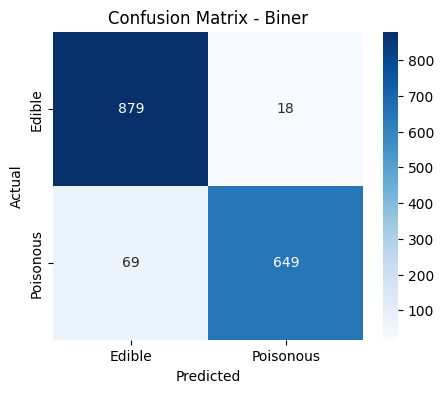

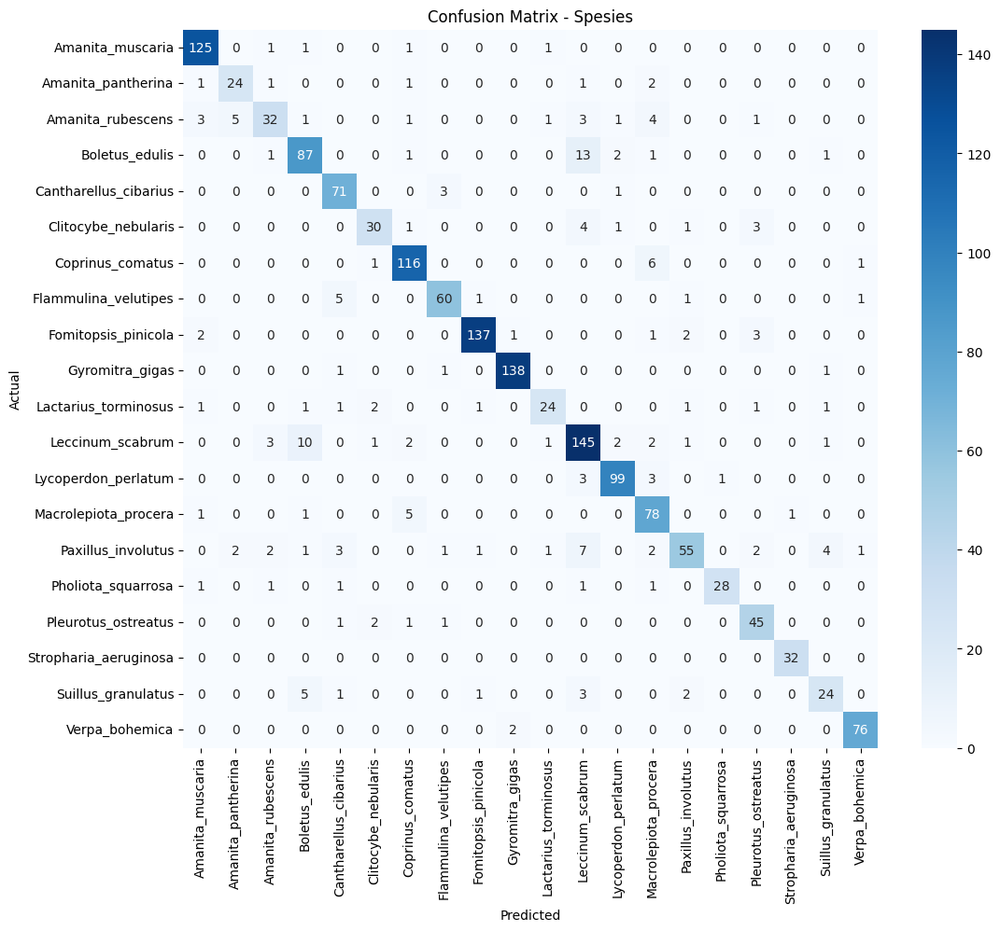

In [ ]:
import numpy as np
import tensorflow as tf
import pandas as pd
import os

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input  # ← FIX
from sklearn.metrics import classification_report

train_path = '/content/drive/MyDrive/Dataset_TugasAkhir/SplitNew/Train'
test_path  = '/content/drive/MyDrive/Dataset_TugasAkhir/SplitNew/Test'
save_path  = '/content/drive/MyDrive/Dataset_TugasAkhir/Models'

IMG_SIZE   = (224, 224)
BATCH_SIZE = 32

def create_df(path):
    files, labels = [], []
    for category in ['Edible', 'Poisonous']:
        cat_path = os.path.join(path, category)
        for species in os.listdir(cat_path):
            species_path = os.path.join(cat_path, species)
            if os.path.isdir(species_path):
                for f in os.listdir(species_path):
                    if f.lower().endswith(('png','jpg','jpeg')):
                        files.append(os.path.join(species_path, f))
                        labels.append(species)
    return pd.DataFrame({'filename': files, 'class': labels})

print("Loading model...")
model = tf.keras.models.load_model(
    os.path.join(save_path, 'best_model_mobilenet_tuned_v4.keras')  # ← FIX
)

print("Scanning test dataset...")
df_test = create_df(test_path)

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_base = test_datagen.flow_from_dataframe(
    df_test,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

print("Predicting...")
y_pred = model.predict(test_base)

pred_biner   = (y_pred[0] > 0.5).astype(int).flatten()
pred_spesies = np.argmax(y_pred[1], axis=1)

y_true_spesies = test_base.classes

target_names = sorted(test_base.class_indices, key=test_base.class_indices.get)

test_class_indices  = test_base.class_indices
edible_species      = os.listdir(os.path.join(train_path, 'Edible'))
edible_indices_test = [v for k, v in test_class_indices.items() if k in edible_species]

y_true_biner = np.array([
    0 if i in edible_indices_test else 1 for i in y_true_spesies
])

print("\n=== HASIL BINER ===")
print(classification_report(y_true_biner, pred_biner,
      target_names=['Edible','Poisonous'], digits=4))

print("\n=== HASIL SPESIES ===")
print(classification_report(y_true_spesies, pred_spesies,
      target_names=target_names, digits=4))

from sklearn.metrics import accuracy_score
print("Accuracy Biner  :", accuracy_score(y_true_biner, pred_biner))
print("Accuracy Spesies:", accuracy_score(y_true_spesies, pred_spesies))

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm_bin = confusion_matrix(y_true_biner, pred_biner)
plt.figure(figsize=(5, 4))
sns.heatmap(cm_bin, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Edible','Poisonous'],
            yticklabels=['Edible','Poisonous'])
plt.title('Confusion Matrix - Biner')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

cm_sp = confusion_matrix(y_true_spesies, pred_spesies)
plt.figure(figsize=(12, 10))
sns.heatmap(cm_sp, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names, yticklabels=target_names)
plt.title('Confusion Matrix - Spesies')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

Loading MobileNetV2 model...
Loading class mapping...
Model dan Mapping siap!

Memulai prediksi folder...



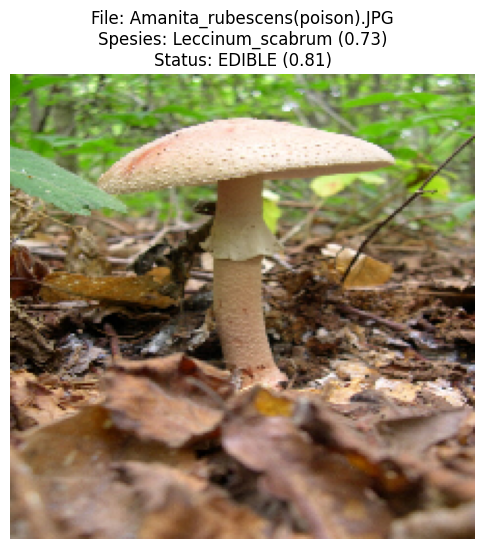

File    : Amanita_rubescens(poison).JPG
Spesies : Leccinum_scabrum (72.54%)
Status  : EDIBLE (80.66%)
----------------------------------------


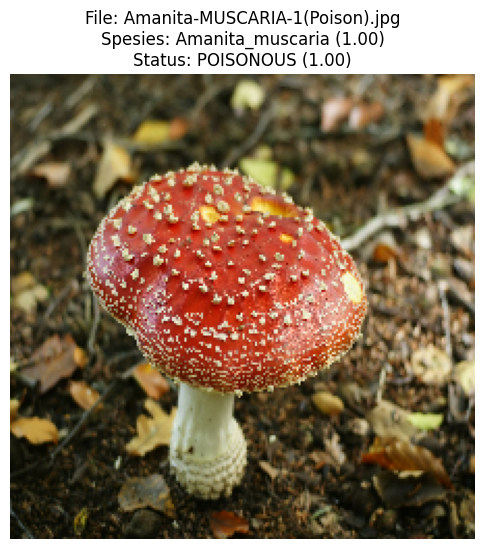

File    : Amanita-MUSCARIA-1(Poison).jpg
Spesies : Amanita_muscaria (99.99%)
Status  : POISONOUS (100.00%)
----------------------------------------


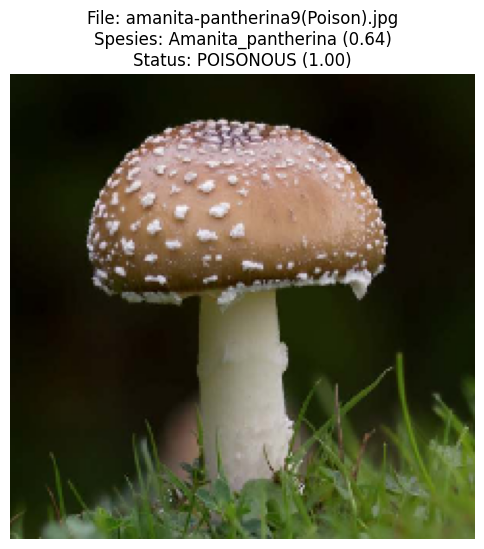

File    : amanita-pantherina9(Poison).jpg
Spesies : Amanita_pantherina (64.15%)
Status  : POISONOUS (99.99%)
----------------------------------------


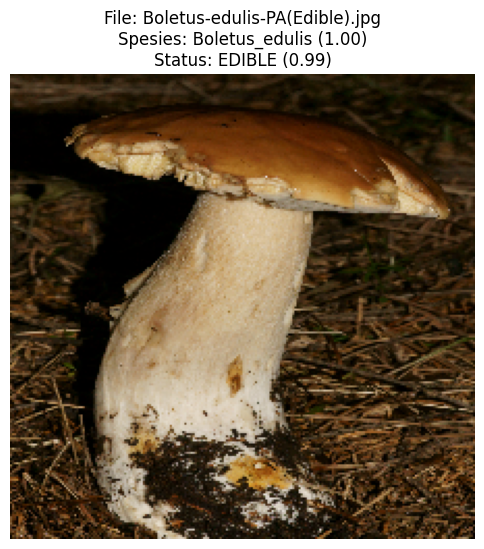

File    : Boletus-edulis-PA(Edible).jpg
Spesies : Boletus_edulis (99.98%)
Status  : EDIBLE (99.01%)
----------------------------------------


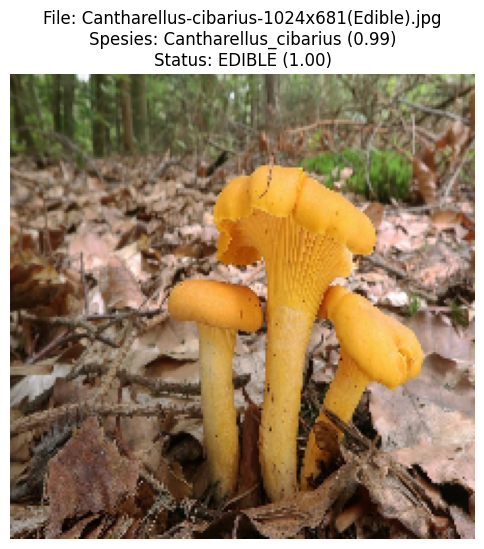

File    : Cantharellus-cibarius-1024x681(Edible).jpg
Spesies : Cantharellus_cibarius (99.21%)
Status  : EDIBLE (99.97%)
----------------------------------------


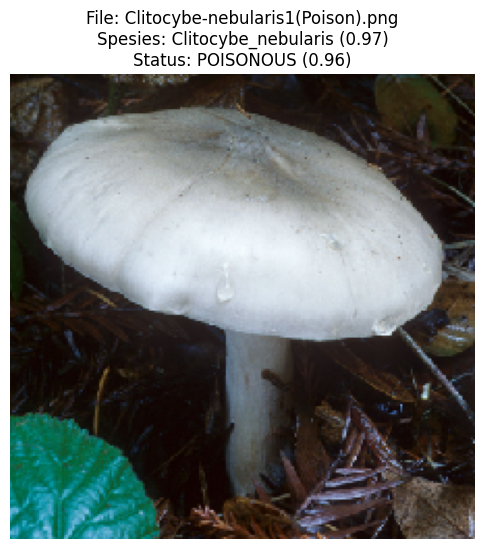

File    : Clitocybe-nebularis1(Poison).png
Spesies : Clitocybe_nebularis (96.60%)
Status  : POISONOUS (96.13%)
----------------------------------------


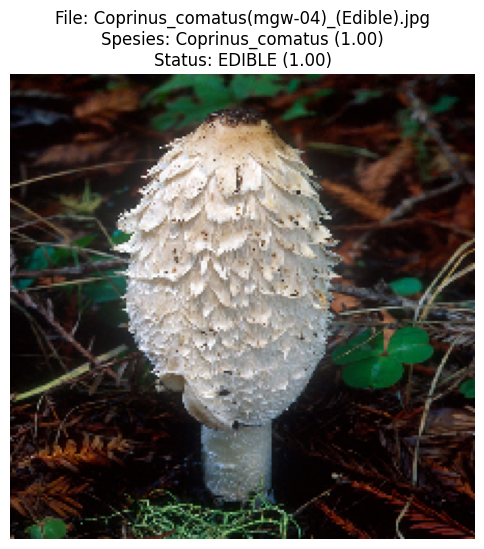

File    : Coprinus_comatus(mgw-04)_(Edible).jpg
Spesies : Coprinus_comatus (99.73%)
Status  : EDIBLE (99.99%)
----------------------------------------


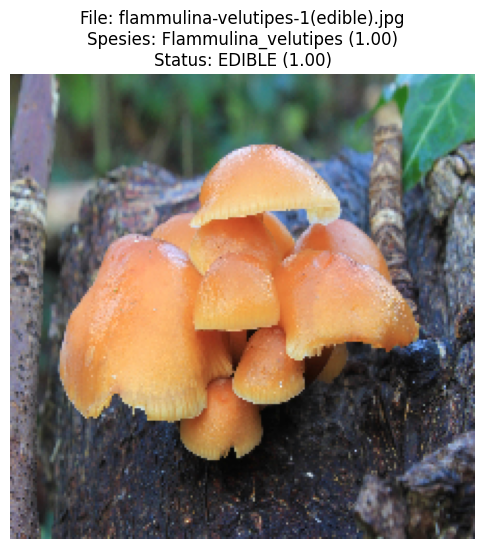

File    : flammulina-velutipes-1(edible).jpg
Spesies : Flammulina_velutipes (100.00%)
Status  : EDIBLE (100.00%)
----------------------------------------


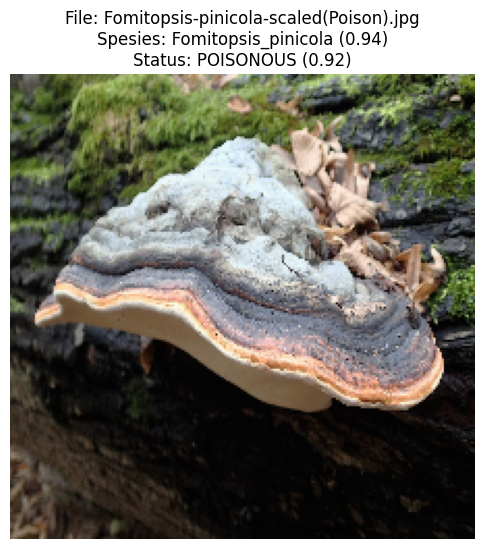

File    : Fomitopsis-pinicola-scaled(Poison).jpg
Spesies : Fomitopsis_pinicola (94.16%)
Status  : POISONOUS (92.21%)
----------------------------------------


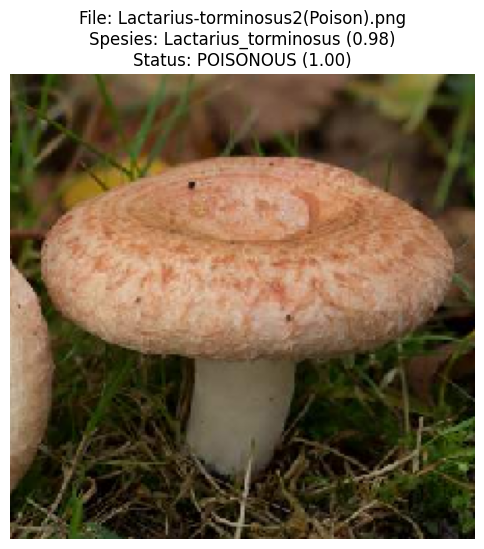

File    : Lactarius-torminosus2(Poison).png
Spesies : Lactarius_torminosus (97.63%)
Status  : POISONOUS (99.73%)
----------------------------------------


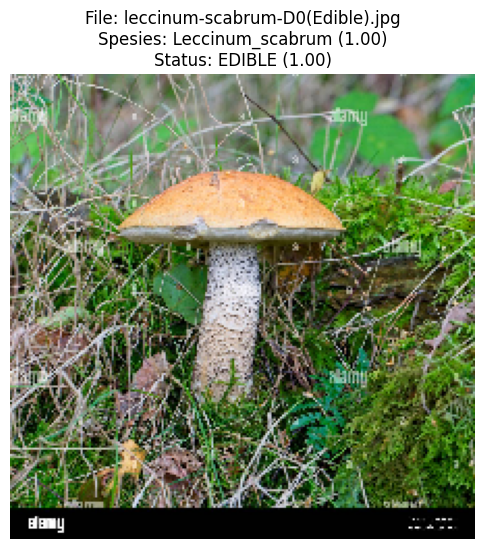

File    : leccinum-scabrum-D0(Edible).jpg
Spesies : Leccinum_scabrum (99.61%)
Status  : EDIBLE (99.96%)
----------------------------------------


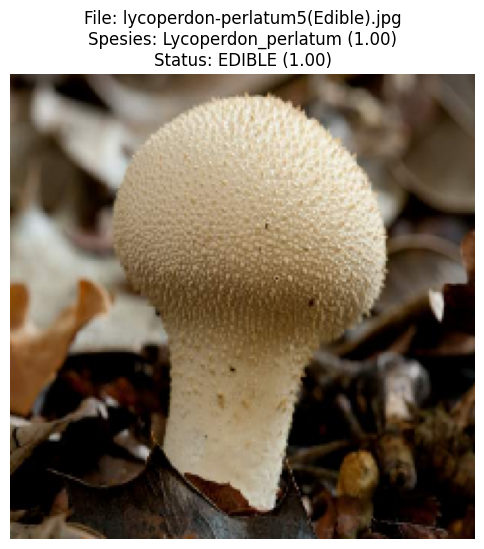

File    : lycoperdon-perlatum5(Edible).jpg
Spesies : Lycoperdon_perlatum (100.00%)
Status  : EDIBLE (100.00%)
----------------------------------------


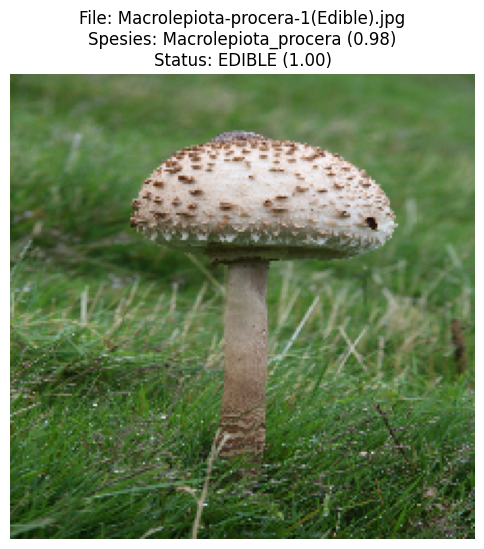

File    : Macrolepiota-procera-1(Edible).jpg
Spesies : Macrolepiota_procera (98.03%)
Status  : EDIBLE (99.73%)
----------------------------------------


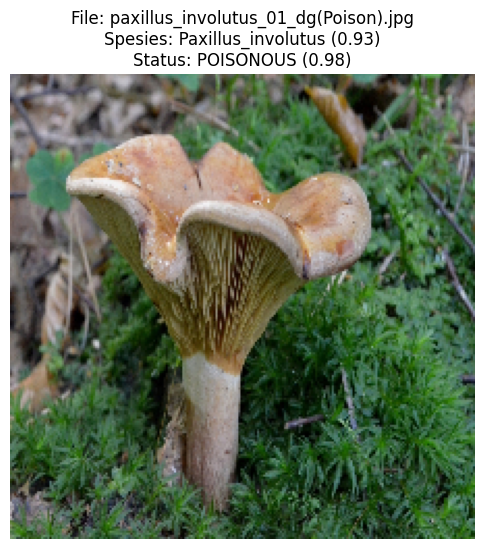

File    : paxillus_involutus_01_dg(Poison).jpg
Spesies : Paxillus_involutus (92.98%)
Status  : POISONOUS (97.73%)
----------------------------------------


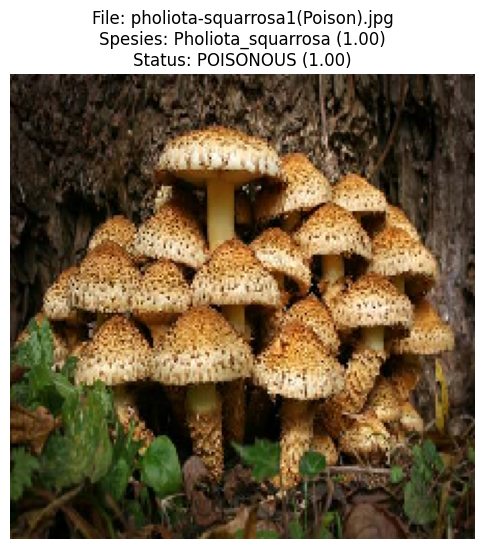

File    : pholiota-squarrosa1(Poison).jpg
Spesies : Pholiota_squarrosa (100.00%)
Status  : POISONOUS (99.99%)
----------------------------------------


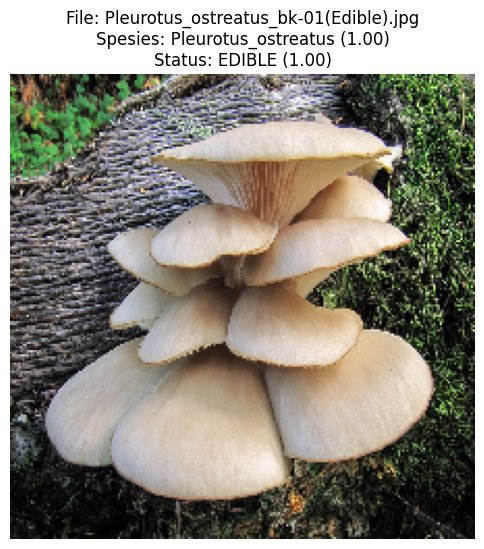

File    : Pleurotus_ostreatus_bk-01(Edible).jpg
Spesies : Pleurotus_ostreatus (99.90%)
Status  : EDIBLE (100.00%)
----------------------------------------


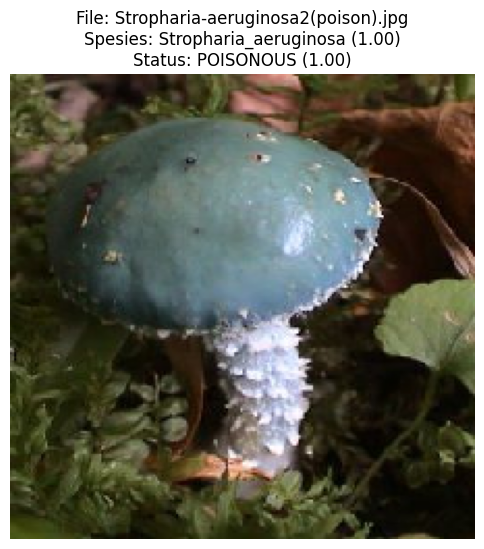

File    : Stropharia-aeruginosa2(poison).jpg
Spesies : Stropharia_aeruginosa (100.00%)
Status  : POISONOUS (99.99%)
----------------------------------------


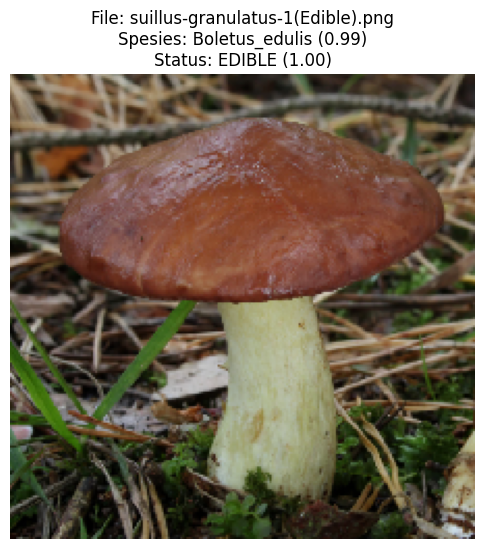

File    : suillus-granulatus-1(Edible).png
Spesies : Boletus_edulis (99.32%)
Status  : EDIBLE (99.95%)
----------------------------------------


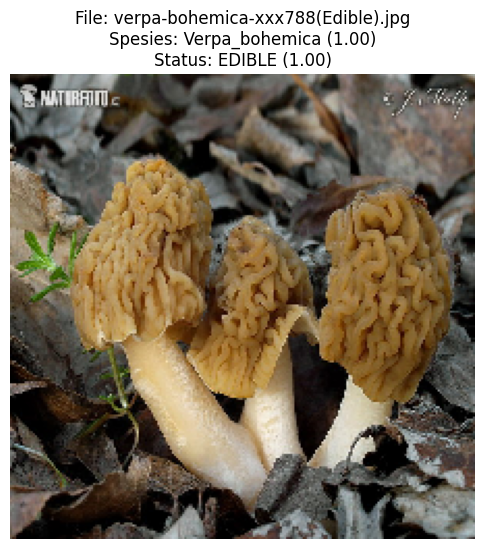

File    : verpa-bohemica-xxx788(Edible).jpg
Spesies : Verpa_bohemica (100.00%)
Status  : EDIBLE (99.98%)
----------------------------------------


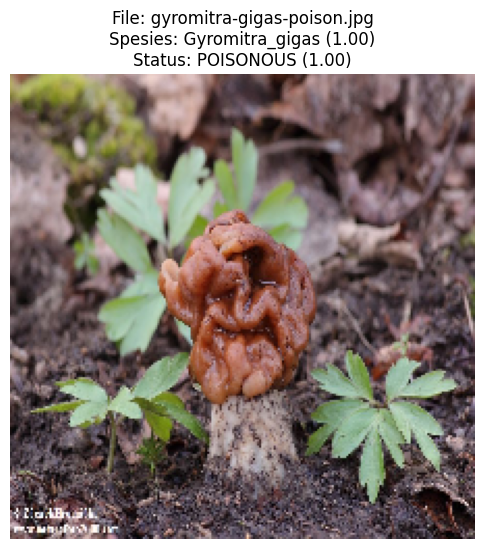

File    : gyromitra-gigas-poison.jpg
Spesies : Gyromitra_gigas (99.99%)
Status  : POISONOUS (99.93%)
----------------------------------------

Prediksi selesai untuk semua gambar!


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import matplotlib.pyplot as plt
import os
import json

IMG_SIZE    = (224, 224)
model_path  = '/content/drive/MyDrive/Dataset_TugasAkhir/Models/best_model_mobilenet_tuned_v4.keras'
json_path   = '/content/drive/MyDrive/Dataset_TugasAkhir/Models/class_indices.json'
test_folder = '/content/drive/MyDrive/Test Class Jamur'

print("Loading MobileNetV2 model...")
model = tf.keras.models.load_model(model_path)

print("Loading class mapping...")
with open(json_path) as f:
    class_indices = json.load(f)

idx_to_class = {v: k for k, v in class_indices.items()}
target_names = [idx_to_class[i] for i in range(len(idx_to_class))]
print("Model dan Mapping siap!")

def prediksi_jamur_single(img_path):
    filename = os.path.basename(img_path)

    img       = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    pred_biner, pred_spesies = model.predict(img_array, verbose=0)

    prob_biner    = pred_biner[0][0]
    probs_spesies = pred_spesies[0]

    if prob_biner > 0.5:
        hasil_biner = "POISONOUS"
        conf_biner  = prob_biner
    else:
        hasil_biner = "EDIBLE"
        conf_biner  = 1 - prob_biner

    idx_spesies   = np.argmax(probs_spesies)
    hasil_spesies = target_names[idx_spesies]
    conf_spesies  = probs_spesies[idx_spesies]

    if conf_spesies < 0.4:
        hasil_spesies = "UNKNOWN"

    plt.figure(figsize=(6, 7))
    plt.imshow(img)
    plt.axis('off')
    plt.title(
        f"File: {filename}\n"
        f"Spesies: {hasil_spesies} ({conf_spesies:.2f})\n"
        f"Status: {hasil_biner} ({conf_biner:.2f})"
    )
    plt.show()

    print(f"File    : {filename}")
    print(f"Spesies : {hasil_spesies} ({conf_spesies*100:.2f}%)")
    print(f"Status  : {hasil_biner} ({conf_biner*100:.2f}%)")
    print("-" * 40)

print("\nMemulai prediksi folder...\n")
if not os.path.exists(test_folder):
    print(f"Error: Folder {test_folder} tidak ditemukan!")
else:
    for file in os.listdir(test_folder):
        if file.lower().endswith(('png', 'jpg', 'jpeg')):
            prediksi_jamur_single(os.path.join(test_folder, file))

print("\nPrediksi selesai untuk semua gambar!")